In [48]:
import numpy as np
import pandas as pd
import plotly.graph_objects as Go

In [50]:
#Tiingo API Key
#d4f97a94b2b3d47ecca77ecf4fba8202840835d7

## Gather Data

In [53]:
import requests

api_key = "token=d4f97a94b2b3d47ecca77ecf4fba8202840835d7"
ticker = "aapl"
base_url = "https://api.tiingo.com/tiingo/daily/"
start_date = "startDate=2000-1-1"
end_date = "endDate=2025-4-27"
format ="format=csv"

request_url = base_url + ticker + "/prices?" + start_date + "&" + end_date + "&" + format + "&" + api_key

print(request_url)

https://api.tiingo.com/tiingo/daily/aapl/prices?startDate=2000-1-1&endDate=2025-4-27&format=csv&token=d4f97a94b2b3d47ecca77ecf4fba8202840835d7


In [55]:
headers = {'Content-Type': 'application/json'}
requestResponse = requests.get(request_url,
                                    headers=headers)
data = pd.read_csv(request_url)

In [57]:
data

,date,close,high,low,open,volume,adjClose,adjHigh,adjLow,adjOpen,adjVolume,divCash,splitFactor
0,2000-01-03,111.94,112.5000,101.6900,104.870,4783900,0.842092,0.846305,0.764984,0.788907,535797335,0.0,1.0
1,2000-01-04,102.50,110.6200,101.1900,108.250,4574800,0.771078,0.832162,0.761223,0.814333,512378112,0.0,1.0
2,2000-01-05,104.00,110.5600,103.0000,103.750,6949300,0.782362,0.831711,0.774839,0.780481,778322378,0.0,1.0
3,2000-01-06,95.00,107.0000,95.0000,106.120,6856900,0.714657,0.804930,0.714657,0.798310,767973567,0.0,1.0
4,2000-01-07,99.50,101.0000,95.5000,96.500,4113700,0.748510,0.759794,0.718419,0.725942,460734860,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6362,2025-04-21,193.16,193.8000,189.8112,193.265,46742537,193.160000,193.800000,189.811200,193.265000,46742537,0.0,1.0
6363,2025-04-22,199.74,201.5900,195.9700,196.120,52976371,199.740000,201.590000,195.970000,196.120000,52976371,0.0,1.0
6364,2025-04-23,204.60,208.0000,202.7990,206.000,52929165,204.600000,208.000000,202.799000,206.000000,52929165,0.0,1.0
6365,2025-04-24,208.37,208.8299,202.9400,204.890,47310989,208.370000,208.829900,202.940000,204.890000,47310989,0.0,1.0


In [59]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6367 entries, 0 to 6366
Data columns (total 13 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date         6367 non-null   object 
 1   close        6367 non-null   float64
 2   high         6367 non-null   float64
 3   low          6367 non-null   float64
 4   open         6367 non-null   float64
 5   volume       6367 non-null   int64  
 6   adjClose     6367 non-null   float64
 7   adjHigh      6367 non-null   float64
 8   adjLow       6367 non-null   float64
 9   adjOpen      6367 non-null   float64
 10  adjVolume    6367 non-null   int64  
 11  divCash      6367 non-null   float64
 12  splitFactor  6367 non-null   float64
dtypes: float64(10), int64(2), object(1)
memory usage: 646.8+ KB


In [61]:
data["date"] = pd.to_datetime(data["date"])

## Data Visualisation 

/Users/furkancanercan/anaconda3/lib/python3.10/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



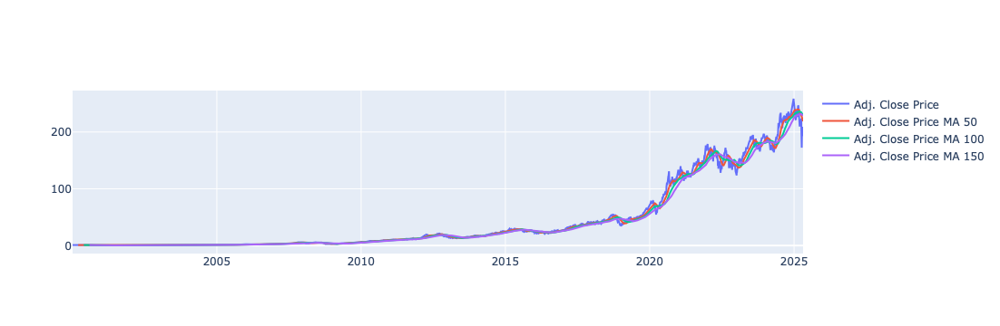

In [90]:
fig = Go.Figure()
#fig.add_trace(Go.Scatter(x=data["date"],y=data["close"],name="Close Price"))
fig.add_trace(Go.Scatter(x=data["date"],y=data["adjClose"],name="Adj. Close Price"))
fig.add_trace(Go.Scatter(x=data["date"],y=data["adjClose"].rolling(50).mean(),name="Adj. Close Price MA 50"))
fig.add_trace(Go.Scatter(x=data["date"],y=data["adjClose"].rolling(100).mean(),name="Adj. Close Price MA 100"))
fig.add_trace(Go.Scatter(x=data["date"],y=data["adjClose"].rolling(150).mean(),name="Adj. Close Price MA 150"))

#Data Transformations
#Log transformation ylogy


#Apple's fourth and final stock split to date happened on 9 June 2014. 
#This was the most significant of Apple's stock splits, with a seven-to-one ratio taking shares from close to $700 down to around $100
#Though the latest split was 4to1 in 28 Aug 2020
#Adjusted price adjusts the price and reevaluates it based on the stock splits
#Thus the adjusted and non-adjusted is the same after the august 2020
#In Cumulative, from 1987 on 224x divided, from 21 June 2000 on 112x divided
#I will use adjusted price!!

In [156]:
from sklearn.preprocessing import PowerTransformer
from scipy import stats
pt = PowerTransformer(method="box-cox",standardize=True)
#Data Transformations
#The optimal lambda parameter for minimizing skewness is estimated on each feature independently using maximum likelihood.
auto_tf = pt.fit_transform(data[["adjClose"]])
log_tf = stats.boxcox(data[["adjClose"]],lmbda=0)
sqrt_tf = stats.boxcox(data[["adjClose"]],lmbda=0.5)
mn_sqrt_tf = stats.boxcox(data[["adjClose"]],lmbda=-0.5)
inv_tf = stats.boxcox(data[["adjClose"]],lmbda=-1)



/Users/furkancanercan/anaconda3/lib/python3.10/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



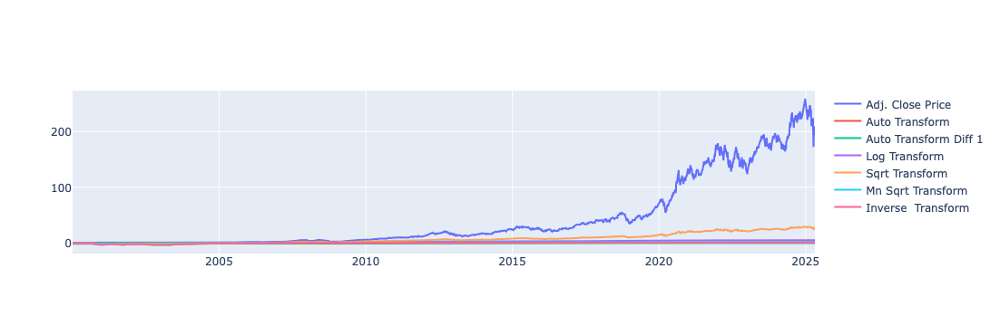

In [166]:
fig = Go.Figure()

fig.add_trace(Go.Scatter(x=data["date"],y=data["adjClose"],name="Adj. Close Price"))
#Box Cox Transformations
fig.add_trace(Go.Scatter(x=data["date"],y=pd.DataFrame(auto_tf)[0],name="Auto Transform"))
fig.add_trace(Go.Scatter(x=data["date"],y=pd.DataFrame(auto_tf)[0].diff(),name="Auto Transform Diff 1"))
fig.add_trace(Go.Scatter(x=data["date"],y=pd.DataFrame(log_tf)[0],name="Log Transform"))
fig.add_trace(Go.Scatter(x=data["date"],y=pd.DataFrame(sqrt_tf)[0],name="Sqrt Transform"))
fig.add_trace(Go.Scatter(x=data["date"],y=pd.DataFrame(mn_sqrt_tf)[0],name="Mn Sqrt Transform"))
fig.add_trace(Go.Scatter(x=data["date"],y=pd.DataFrame(inv_tf)[0],name="Inverse  Transform"))
#fig.add_trace(Go.Scatter(x=data["date"],y=data["adjClose"].rolling(50).mean(),name="Adj. Close Price MA 50"))
#fig.add_trace(Go.Scatter(x=data["date"],y=data["adjClose"].rolling(100).mean(),name="Adj. Close Price MA 100"))
#fig.add_trace(Go.Scatter(x=data["date"],y=data["adjClose"].rolling(150).mean(),name="Adj. Close Price MA 150"))

/Users/furkancanercan/anaconda3/lib/python3.10/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



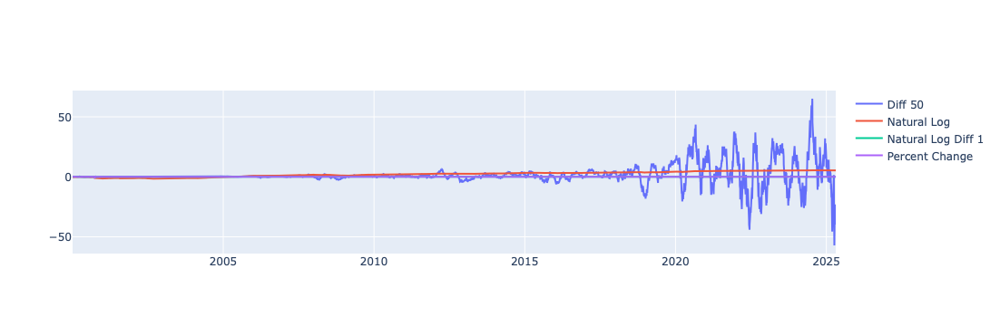

In [66]:
#Clearly the data is not stationary
#For Adjusted Price
fig = Go.Figure()
#Best One is percent Change
fig.add_trace(Go.Scatter(x=data["date"],y=data.diff(50)["adjClose"],name="Diff 50"))
fig.add_trace(Go.Scatter(x=data["date"],y=np.log(data["adjClose"]),name="Natural Log"))
fig.add_trace(Go.Scatter(x=data["date"],y=np.log(data["adjClose"]).diff(),name="Natural Log Diff 1"))
fig.add_trace(Go.Scatter(x=data["date"],y=data["adjClose"].pct_change(),name="Percent Change"))


In [21]:
#Time Series Module
import statsmodels.tsa.api as tsa
#Time Series Plots Module
import statsmodels.graphics.tsaplots as tsap

Figure(640x480)


/var/folders/y8/_tls9hb53pqg18gnfh6ghf5c0000gn/T/ipykernel_18820/2475487695.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/y8/_tls9hb53pqg18gnfh6ghf5c0000gn/T/ipykernel_18820/2475487695.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



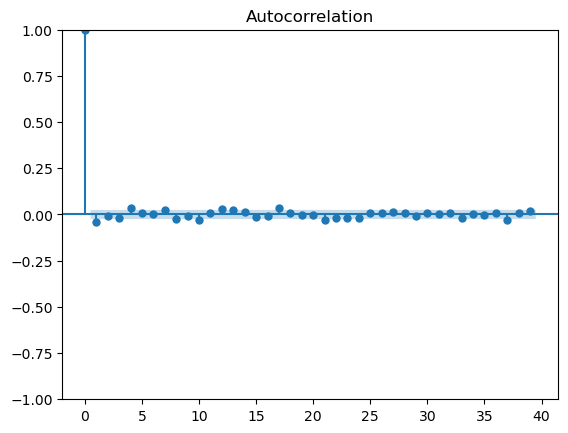

In [174]:
#Adjusted price percent change
data_pred = data[["date","adjClose"]]
data_pred["adjClose"] = data_pred["adjClose"].pct_change()
data_pred.dropna(inplace=True)

print(tsap.plot_acf(data_pred["adjClose"]))

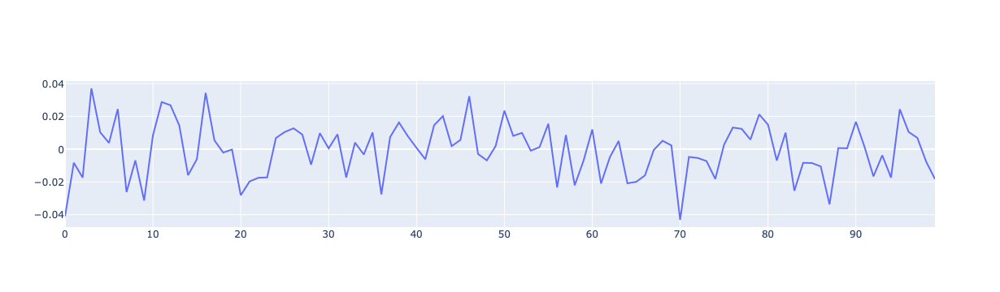

In [23]:
#To see the ACF Better extract the 0th index
#It shuts of after the first index which is the data itselt so no autocorrelation ??
fig = Go.Figure()
fig.add_trace(Go.Scatter(x=np.arange(0,len(tsa.acf(data_pred["adjClose"],nlags=100))), y=tsa.acf(data_pred["adjClose"],nlags=100)[1:]))

Figure(640x480)


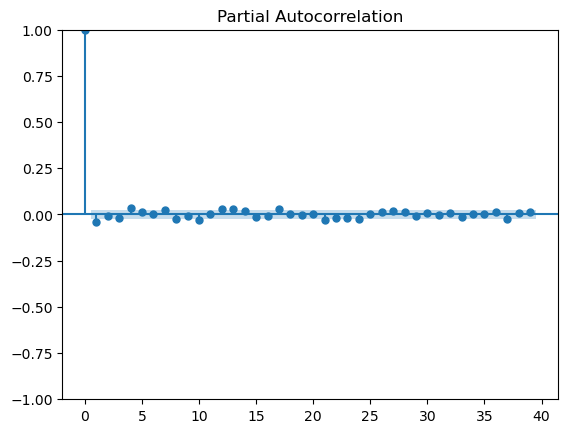

In [24]:
print(tsap.plot_pacf(data_pred["adjClose"]))

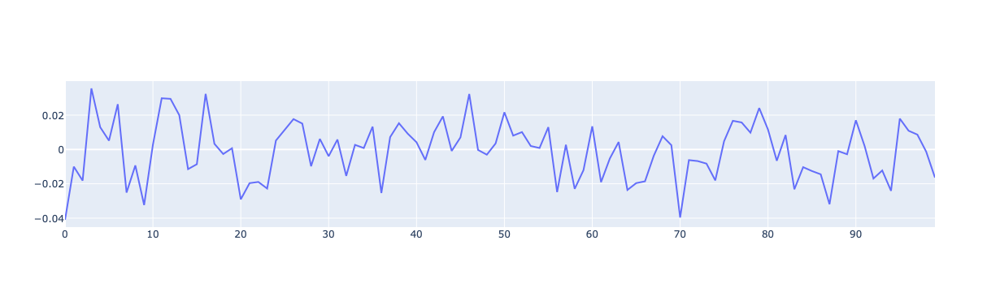

In [25]:
#To see the ACF Better extract the 0th index
#It shuts of after the first index which is the data itselt so no pacf ??
fig = Go.Figure()
fig.add_trace(Go.Scatter(x=np.arange(0,len(tsa.pacf(data_pred["adjClose"],nlags=100))), y=tsa.pacf(data_pred["adjClose"],nlags=100)[1:]))

In [36]:
from pmdarima import auto_arima
